In [8]:
import os
cap = cv2.VideoCapture('/home/priyam/Downloads/sample.mp4')
frames = []
os.mkdir("/home/priyam/Downloads/frame_photos")
if cap.isOpened():
    current_frame = 0
    for i in range(10):
        ret, frame = cap.read()
        if ret:
            name = f'/home/priyam/Downloads/frame_photos/frame{current_frame}.jpg'
            print(f"Creating file... {name}")
            cv2.imwrite(name, frame)
            frames.append(name)
        current_frame += 1
    cap.release()
cv2.destroyAllWindows()

Creating file... /home/priyam/Downloads/frame_photos/frame0.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame1.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame2.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame3.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame4.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame5.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame6.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame7.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame8.jpg
Creating file... /home/priyam/Downloads/frame_photos/frame9.jpg


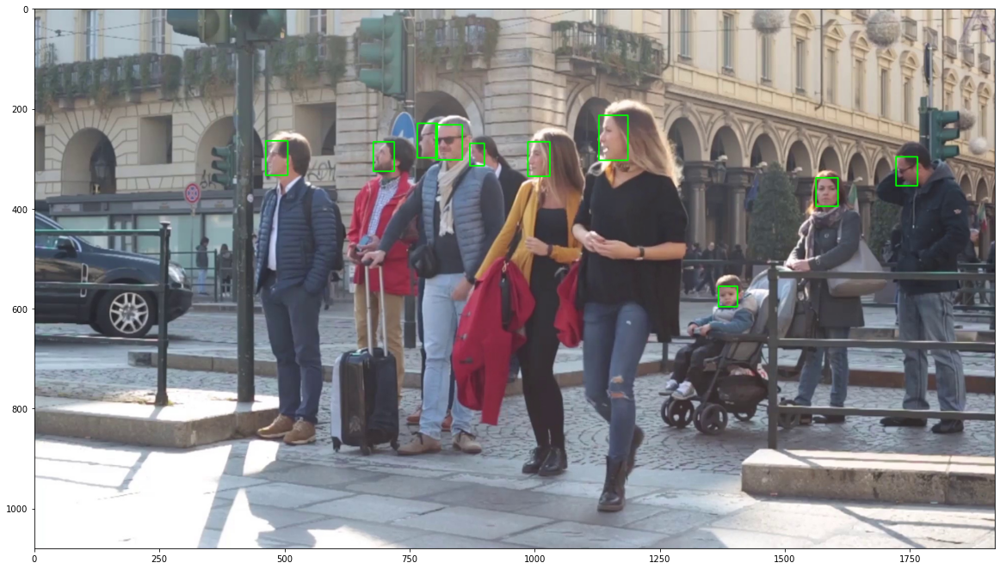

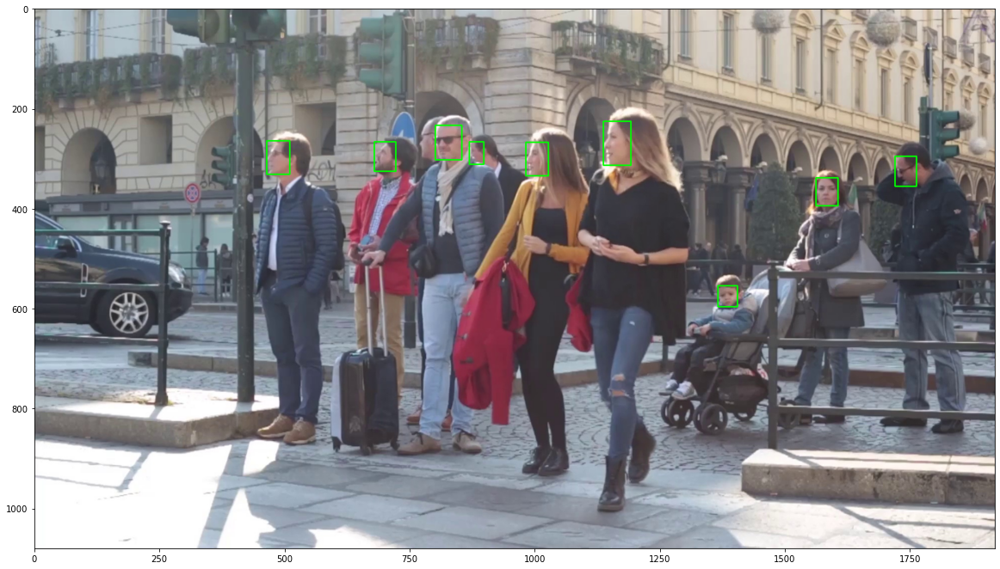

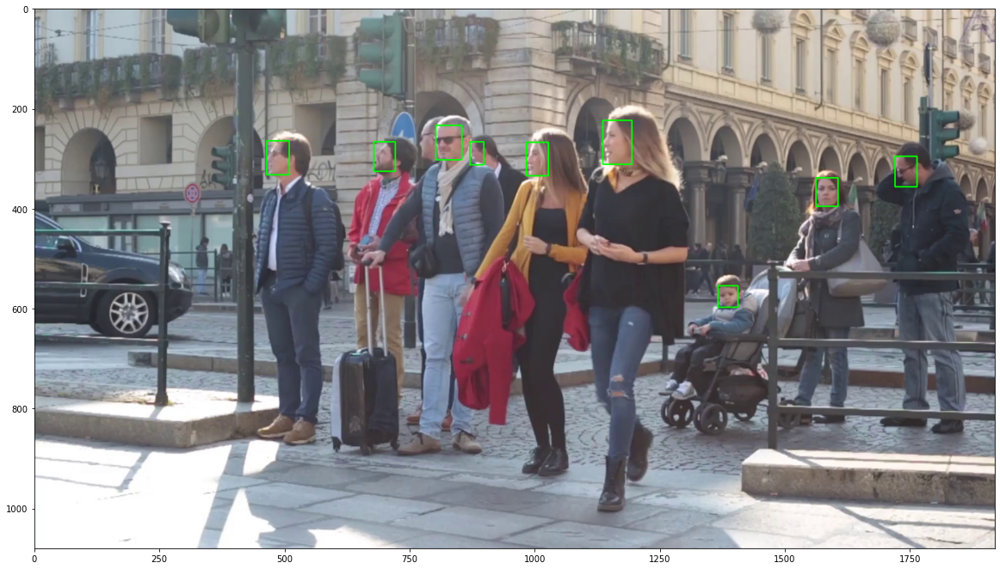

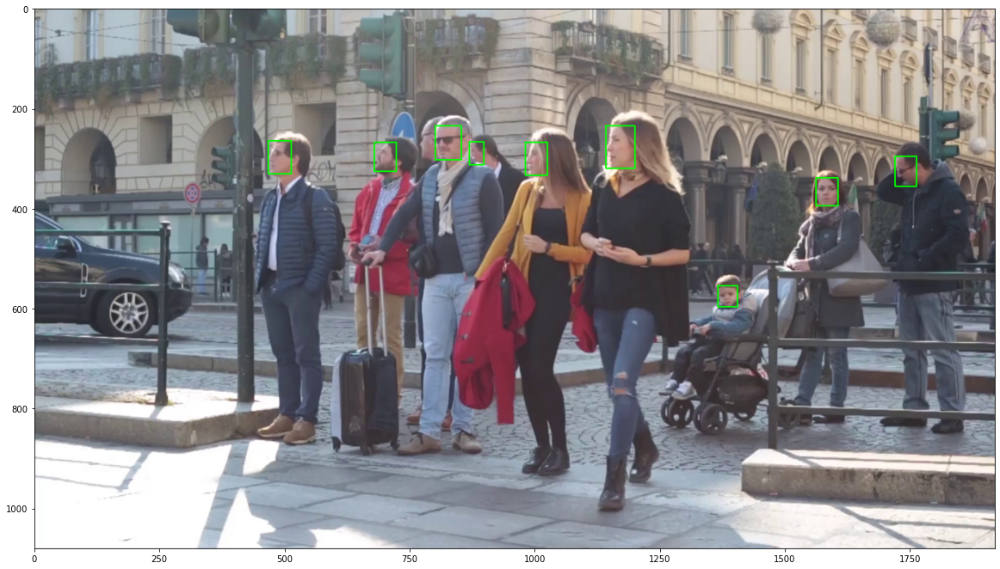

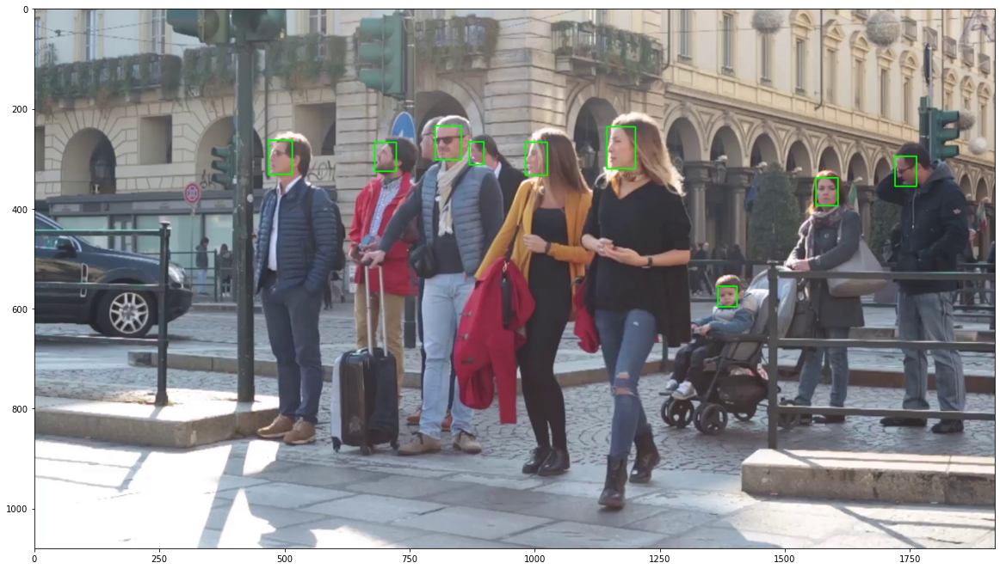

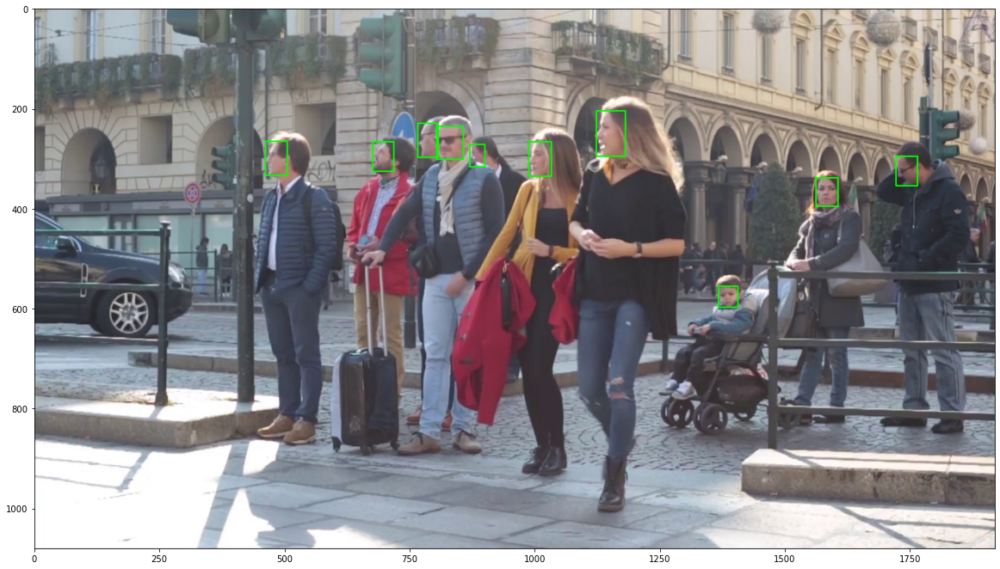

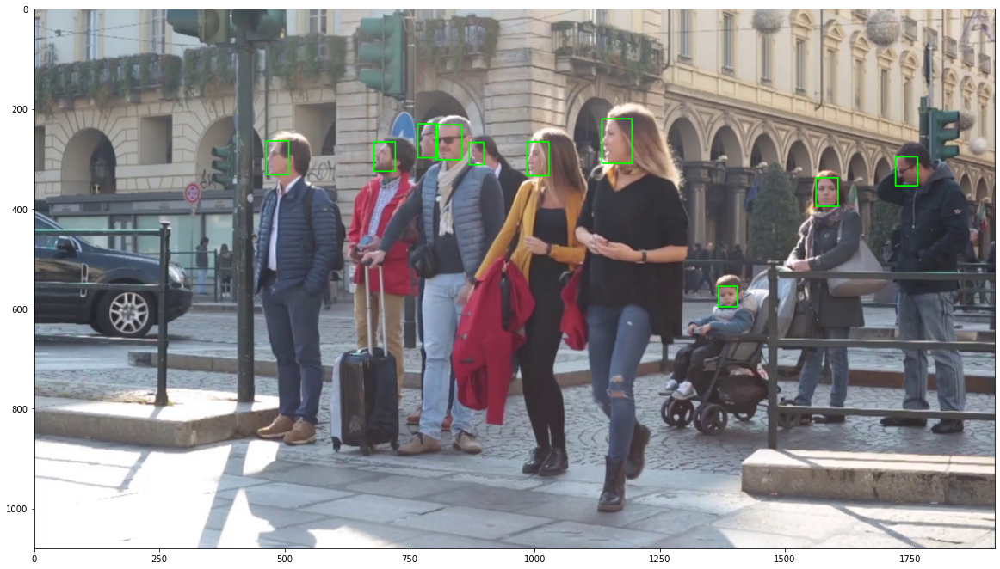

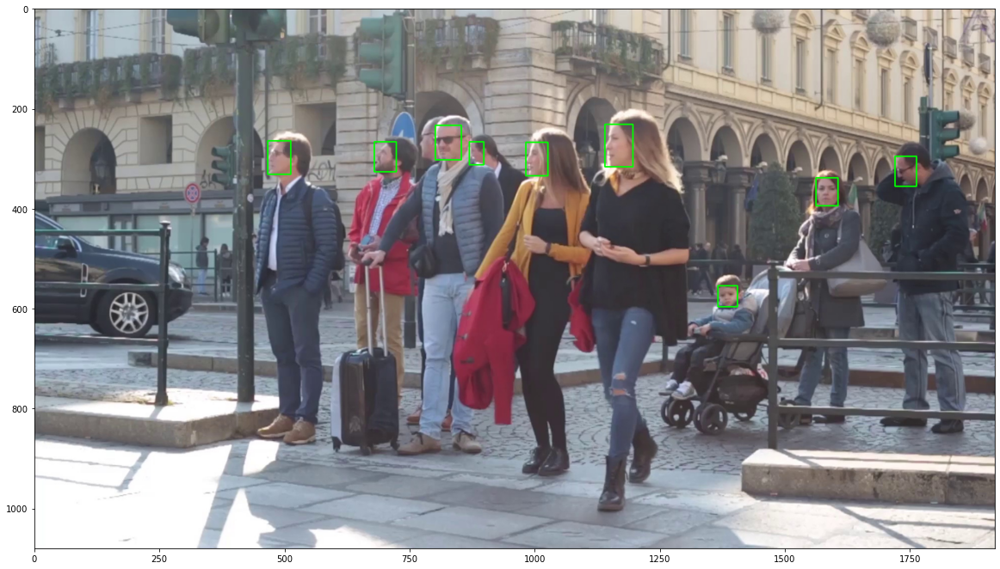

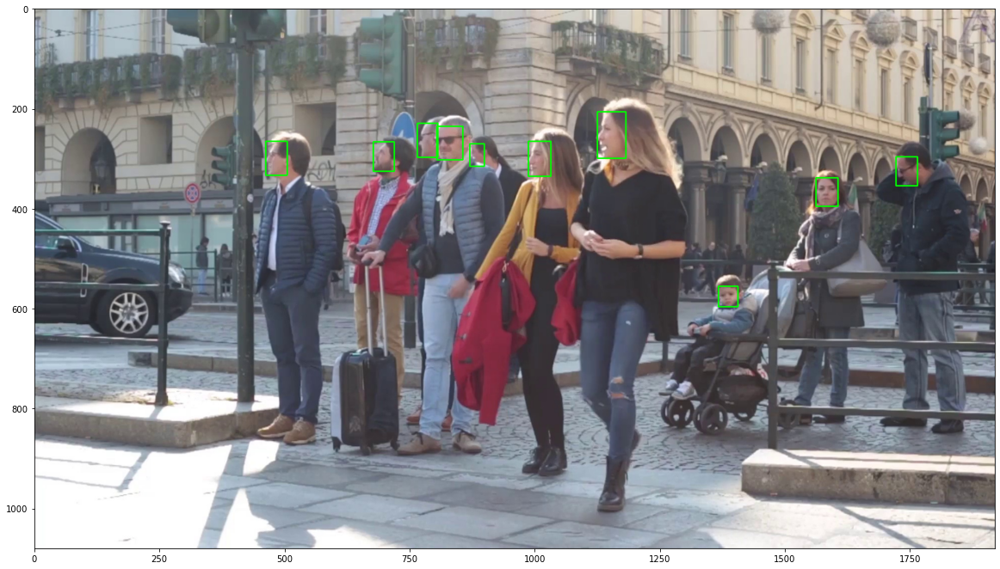

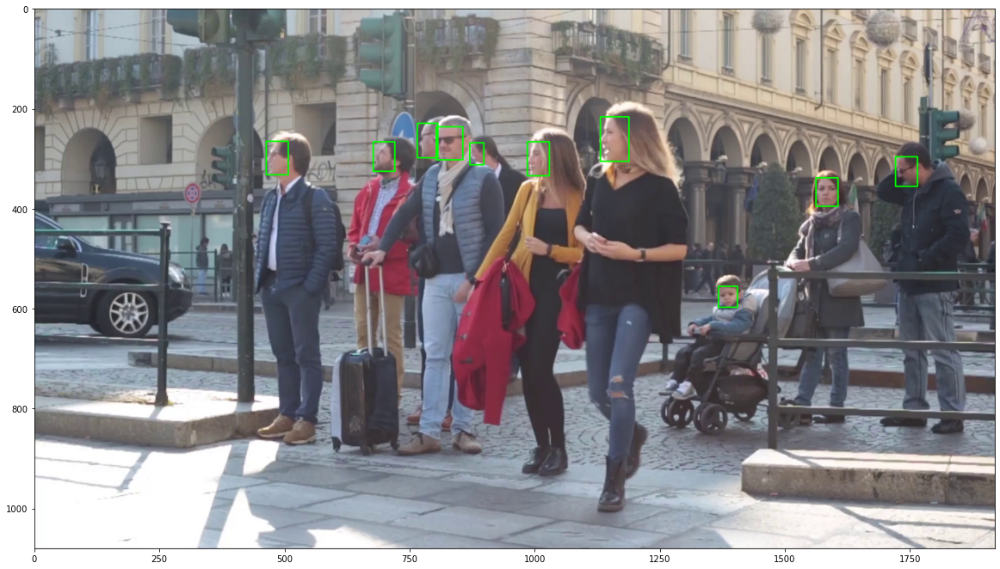

In [16]:
from retinaface import RetinaFace
import cv2
import matplotlib.pyplot as plt
frame_path ='/home/priyam/Downloads/frame_photos'
store_dr = "/home/priyam/Downloads/test_data"
j = 0
for i in os.listdir(frame_path):
    img_path = os.path.join(frame_path, i)
    img = cv2.imread(img_path)
    obj = RetinaFace.detect_faces(img_path)
    faces_lst = []
    face_names = list(obj.keys())
    for key in obj.keys():
        identity = obj[key]
        facial_area = identity['facial_area']
        faces_lst.append((facial_area[0], facial_area[1], facial_area[2], facial_area[3]))
    for (x,y,w,h) in faces_lst:
        name = faces_lst.index((x,y,w,h))
        f = img[y:h, x:w]
        face = cv2.resize(f, (224,224))
        cv2.imwrite(store_dr +'/'+ face_names[name] + str(j) + '_faces.jpg', face)
    j+=1
    for key in obj.keys():
        identity = obj[key]
        facial_area = identity['facial_area']
        cv2.rectangle(img, (facial_area[2], facial_area[3]), (facial_area[0], facial_area[1]), (0, 255, 0), 2)
    plt.figure(figsize=(20,20))
    plt.imshow(img[:, :, ::-1])
    plt.show()